# <font style = "color:rgb(50,120,229)"> Coin Detection </font>

So far we have studied about various mophological operations and different thresholding techniques in some detail. Now it's time to apply these concepts for a practical application - **Coin Detection**.

## <font style = "color:rgb(50,120,229)"> Aim </font>

In this assignment, you will work with 2 different images (so 2 different parts) and will use **only** morphological operations and thresholding techniques to detect the total number of coins present in the image. Your submission will be graded based on your use of the concepts covered in this module, experimentation performed to achieve at your final solution, documentation, and finally, the total number of coins successfully detected in the images. Each part will be of 15 marks. This assignment will be entirely **manually graded** so make sure that you do NOT remove any experimentation you have done as well as the observation you made after each step.

**Proper documentation for each step should be provided with help of markdown**

## <font style = "color:rgb(50,120,229)">Outline</font>

The main steps that you can follow to solve this assignment are:

1. Read the image.
2. Convert it to grayscale and split the image into the 3 (Red, Green and Blue) channels. Decide which of the above 4 images you want to use in further steps and provide reason for the same.
3. Use thresholding and/or morphological operations to arrive at a final binary image.
4. Use **simple blob detector** to count the number of coins present in the image.
5. Use **contour detection** to count the number of coins present in the image.
6. Use **CCA** to count the number of coins present in the image.

**We have also provided the results we obtained at the intermediate steps for your reference.**

# <font style = "color:rgb(50,120,229)">Assignment Part - A</font>

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

In [88]:
import cv2
import matplotlib.pyplot as plt
from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

In [89]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5,1,'Original Image')

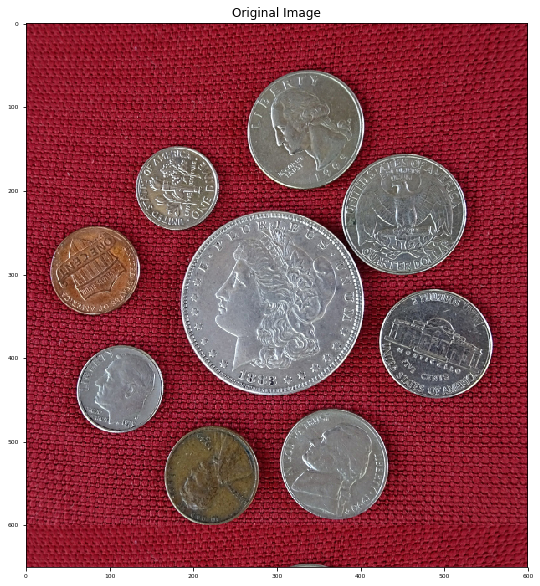

In [90]:
# Image path
imagePath = DATA_PATH + "images/CoinsA.png"
# Read image
# Store it in the variable "image"
image= cv2.imread(imagePath,cv2.IMREAD_COLOR)

imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [91]:
# Convert image to grayscale
# Store it in the variable imageGray
imageGray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)


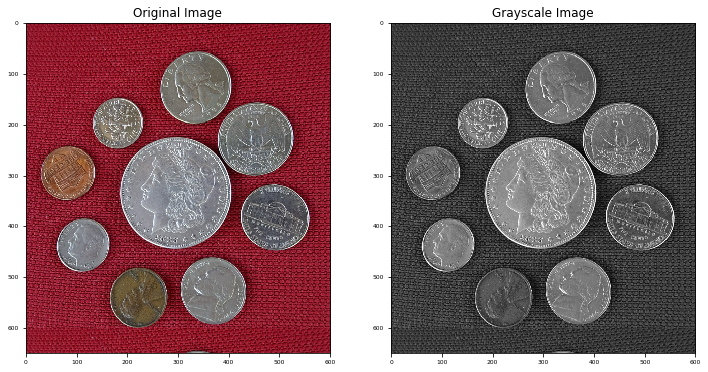

In [92]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [93]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR
imageB,imageG,imageR = cv2.split(image)


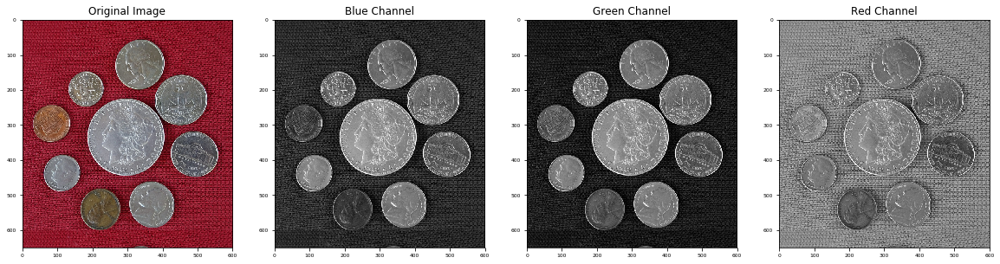

In [94]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,255,50)">Experiments: Compare threshold image from different channels</font>
Randomly select a low threshold value to make dark background and bright coins. Find out which channel has the best contrast.

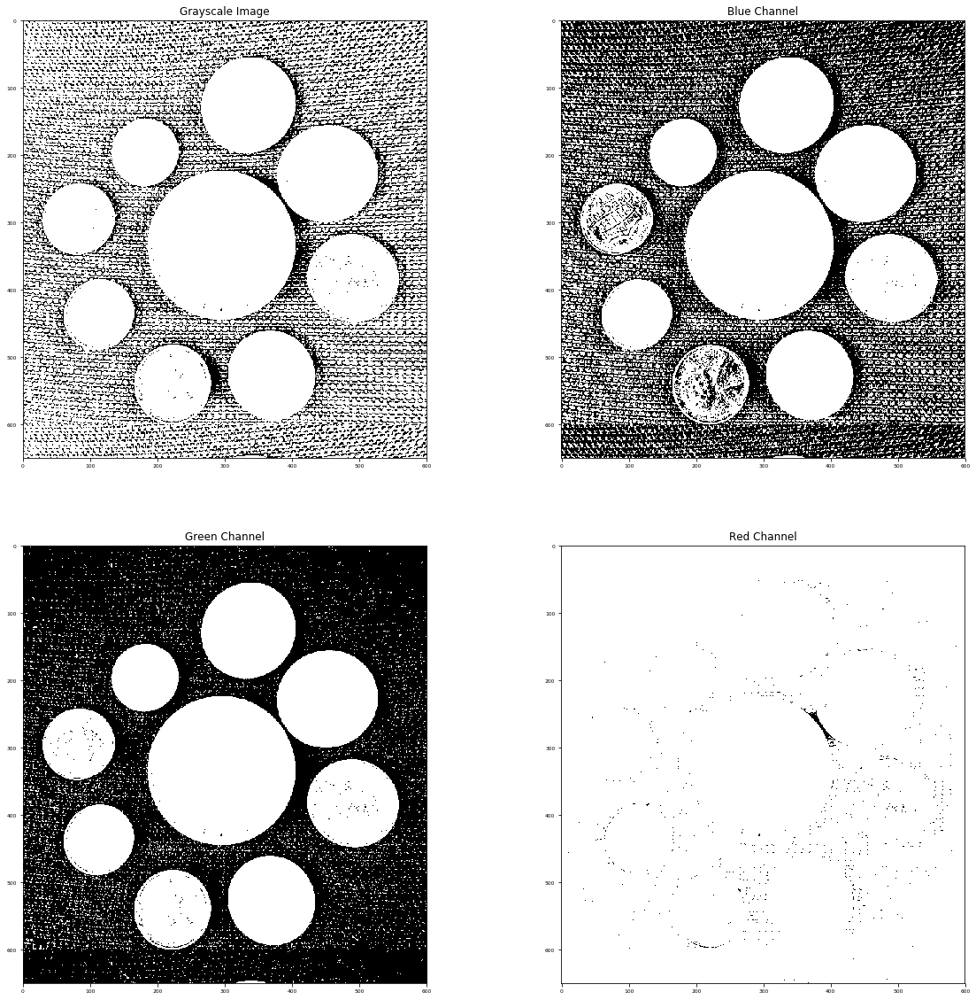

In [95]:
thresh=50
maxValue=255
th, threshedImGr = cv2.threshold(imageGray, thresh, maxValue, cv2.THRESH_BINARY)
th, threshedImB=cv2.threshold(imageB, thresh, maxValue, cv2.THRESH_BINARY)
th, threshedImG=cv2.threshold(imageG, thresh, maxValue, cv2.THRESH_BINARY)
th, threshedImR=cv2.threshold(imageR, thresh, maxValue, cv2.THRESH_BINARY)
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(threshedImGr);
plt.title("Grayscale Image")
plt.subplot(222)
plt.imshow(threshedImB);
plt.title("Blue Channel")
plt.subplot(223)
plt.imshow(threshedImG);
plt.title("Green Channel")
plt.subplot(224)
plt.imshow(threshedImR);
plt.title("Red Channel");

## <font style = "color:rgb(50,255,50)">Conclusion: Image Selection- use the image with green channel</font>
The green-channel image provides the best contrast. This makes more efficient morphological operations. 

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

## <font style = "color:rgb(50,255,50)">Conclusion: max value by thresholding</font>
Since we plan to use the reversed threshold display, we will initially make the coins as bright as possible. By the inversion, it will become as dark as possible.
Therefore, we set the max threshold value to be 255.

## <font style = "color:rgb(50,255,50)">Experiments for thresholding</font>
We will run through a rough list of threshhold values and identify the range to review threshold values in details at the next step. Use THRESH_BINARY to find the brightest coins first. It is easier to view the dark spot on the bright coin. Then later use THRESH_BINARY_INV to covert to dark coins


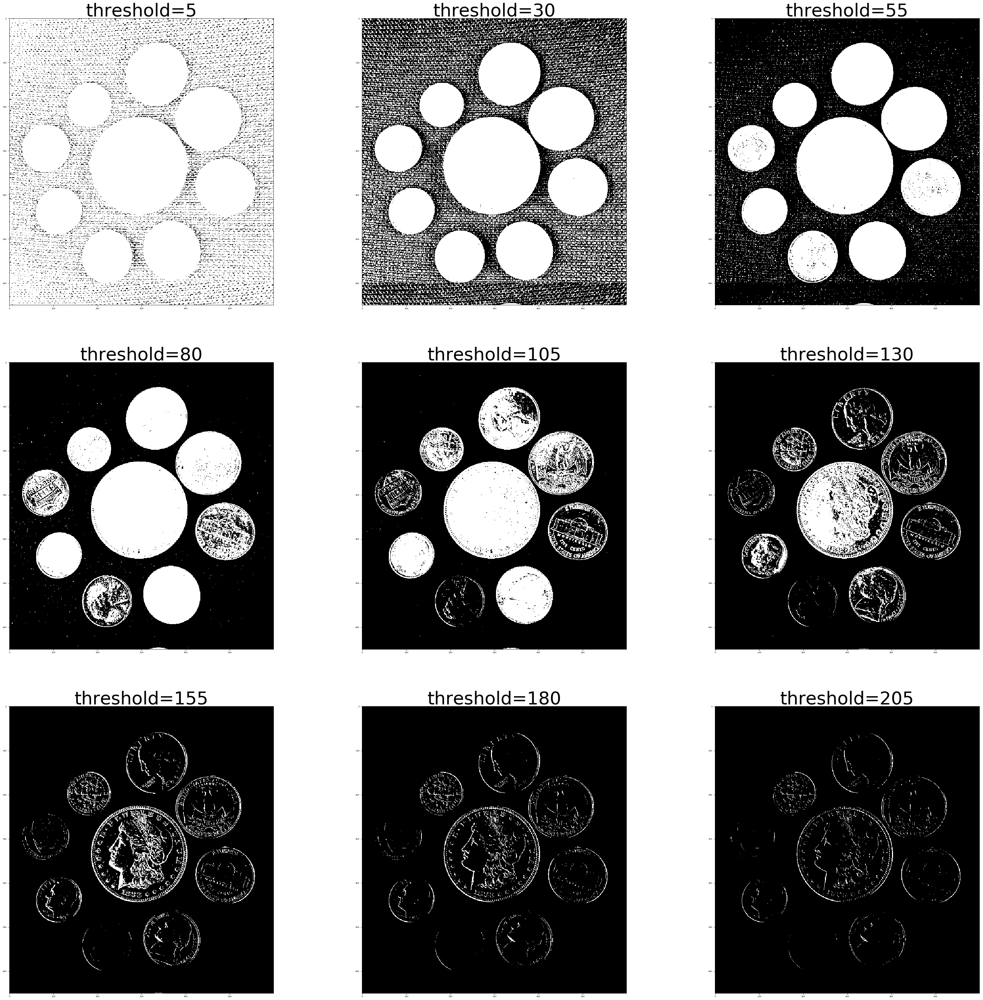

In [96]:
maxValue=255
image_array=[]
qty=9
end=5+25*qty+1
for thresh in range(5,end,25):
    th, dst = cv2.threshold(imageG, thresh, maxValue, cv2.THRESH_BINARY)
    image_array.append(dst)

plt.figure(figsize=(50,50))

imrow=3
imcol=3
for i in range(qty):
    plt.subplot(imrow, imcol, i + 1)
    plt.imshow(image_array[i])
    plt.title("threshold={}".format(5+i*25), size=50)
plt.show()
    

## <font style = "color:rgb(50,255,50)">Experiments: small threshold step</font>
The thresholds ranging from 20 to 50 may work. Lower the threshold step.

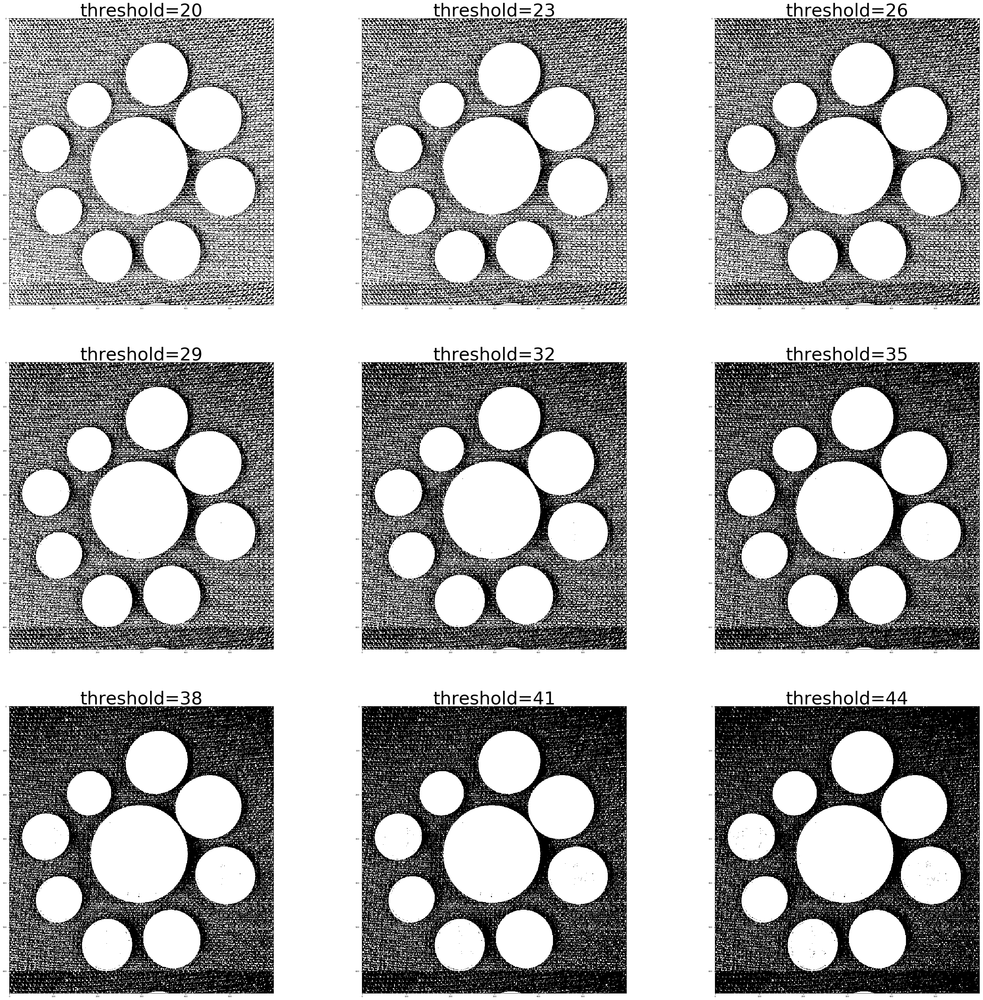

In [97]:
image_array=[]
plt.figure(figsize=(50,50))

imrow=3
imcol=3
qty=9
step=3
start=20
end=start+qty*step+1

for thresh in range(start,end,step):
    th, dst = cv2.threshold(imageG, thresh, maxValue, cv2.THRESH_BINARY)
    image_array.append(dst)
    
for i in range(9):
    plt.subplot(imrow, imcol, i + 1)
    plt.imshow(image_array[i])
    plt.title("threshold={}".format(start+i*step), size=50)
    
plt.show()


## <font style = "color:rgb(50,255,50)">Experiments: use dilated images to judge. </font>

For threshold around 20 to 40, they all seem to have bright coins without much dark spots on the coins.

Use Dilated Image for comparison. Include two kernel sizes. Step through the threshold in this set and use dilated image quality to select the final threshold value.

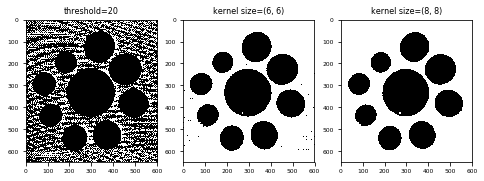

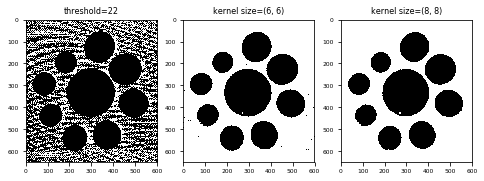

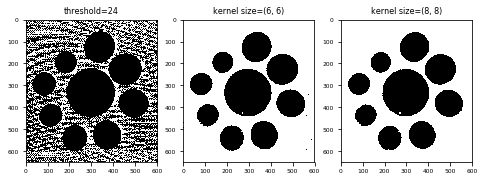

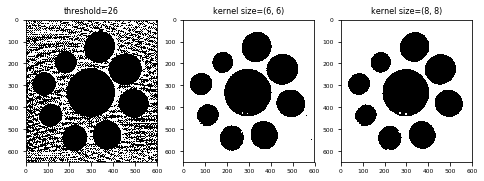

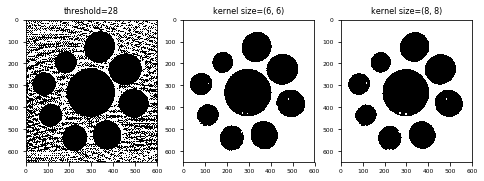

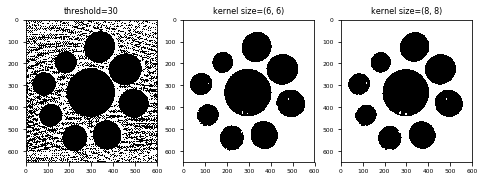

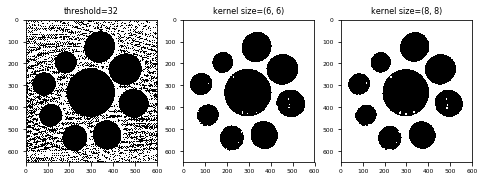

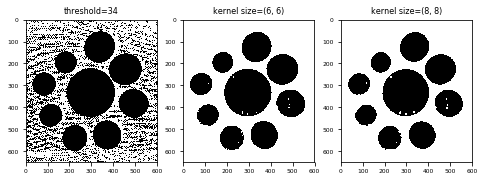

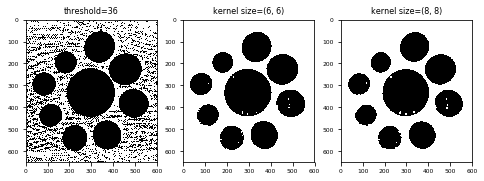

In [98]:
matplotlib.rcParams['xtick.labelsize']=6
matplotlib.rcParams['ytick.labelsize']=6

#Dilation on thresholded image (Kernel size 1)
kdSize = (6,6)
kernel_d = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kdSize)

#Dilation on thresholded image (Kernel size 2)
kdSize2 = (8,8)
kernel_d2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kdSize2)

imrow=1
imcol=3
qty=9
step=2
start=20
end=start+qty*step

itr=1

for thresh in range(start,end,step):
    th, dst = cv2.threshold(imageG, thresh, maxValue, cv2.THRESH_BINARY_INV)
    plt.figure(figsize=(8,100))
    plt.subplot(imrow, imcol, 1); plt.imshow(dst);
    plt.title("threshold={}".format(thresh), size=8)
    
    dilatedIm = cv2.dilate(dst, kernel_d, iterations=itr)
    plt.subplot(imrow, imcol, 2); plt.imshow(dilatedIm);
    plt.title("kernel size={}".format(kdSize), size=8)
    
    dilatedIm2 = cv2.dilate(dst, kernel_d2, iterations=itr)
    plt.subplot(imrow, imcol, 3); plt.imshow(dilatedIm2);
    plt.title("kernel size={}".format(kdSize2), size=8)


## <font style = "color:rgb(50,255,50)">Conclusion: Final threshold value= 24. </font>

(1) Background clean up- Large kernel cleans up better

(2) Residual on coins- Small kernel causes smaller residuals. 

(3) However, the quantity of residuals seem to stay the same regardless of kernel size

(4) Number of white spots on the coins increases at threshold 26, then 32. Since there is only single residual at each coin at threshold 24, it is easier to clean up the background using dilation, then fill the white residual using erosion. This sequence prevents the background to be cloudy again. The final selection is to use threshold 24

Therefore, we will use threshold 24 on the green-channel image 

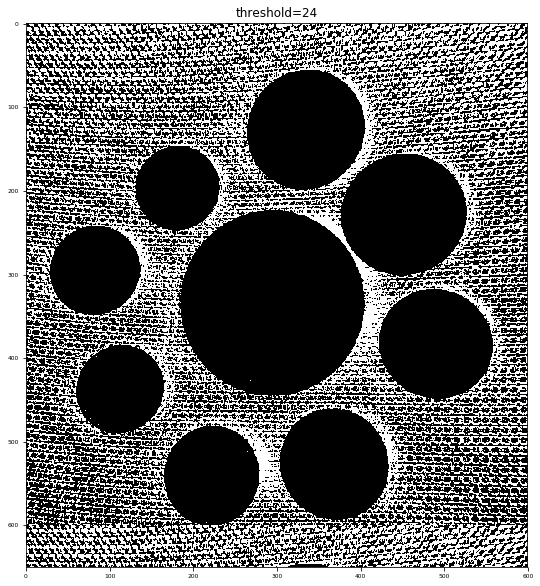

In [99]:
# Display the thresholded image
thresh=24
th, threshedIm = cv2.threshold(imageG, thresh, maxValue, cv2.THRESH_BINARY_INV)
plt.imshow(threshedIm); plt.title("threshold={}".format(thresh)); plt.show()


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

## <font style = "color:rgb(50,255,50)"> Experiment for Dilation iteration </font>
We will use smaller kernel to clean up the background as much as possible without significantly enlarging the white residual on the coins. Compare the dilation iteration to determine final decision
Use two thresholds to confirm the threshold 24 is the right choice

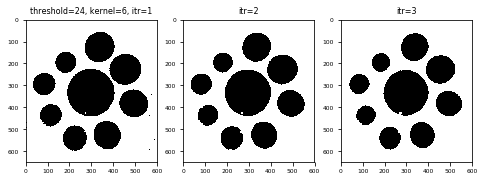

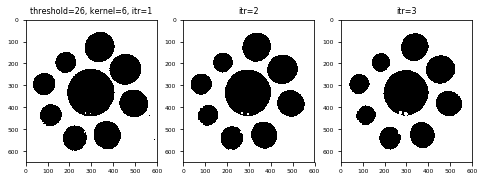

In [100]:
imrow=1
imcol=3
qty=2
step=2
start=24
end=start+qty*step

for thresh in range(start,end,step):
    th, dst = cv2.threshold(imageG, thresh, maxValue, cv2.THRESH_BINARY_INV)
    plt.figure(figsize=(8,100))
    d_itrIm = cv2.dilate(dst, kernel_d, iterations=1)
    plt.subplot(imrow, imcol, 1); plt.imshow(d_itrIm);
    plt.title("threshold={}, kernel={}, itr={}".format(thresh, kdSize[0],1), size=8)
    
    d_itrIm2 = cv2.dilate(dst, kernel_d, iterations=2)
    plt.subplot(imrow, imcol, 2); plt.imshow(d_itrIm2);
    plt.title("itr={}".format(2), size=8)
    
    d_itrIm3 = cv2.dilate(dst, kernel_d, iterations=3)
    plt.subplot(imrow, imcol, 3); plt.imshow(d_itrIm3);
    plt.title("itr={}".format(3), size=8)


## <font style = "color:rgb(50,255,50)"> Conclusion for Dilation </font>
(1) Use kernel size 6 and iteration=2 to clean up the background without breaking the round shape of the coins

(2) Keep the threshold to be 24 because it maintains single residual at each coin

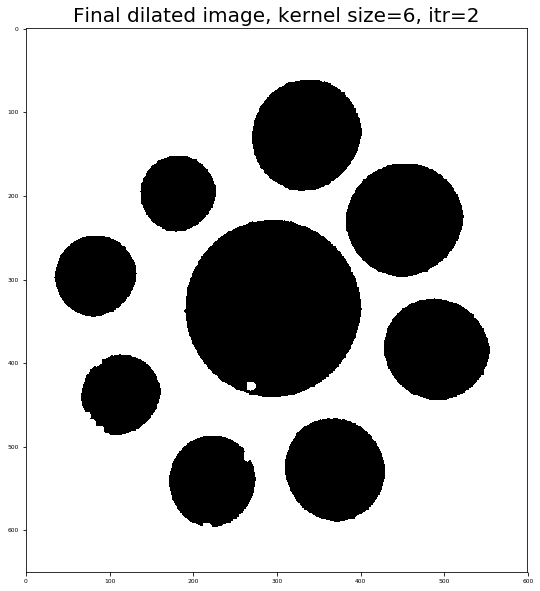

In [101]:
kdSize6 = (6,6)
kernel_d6 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kdSize6)
itr=2
# Apply dilate function on the input image

FinaldilatedIm = cv2.dilate(threshedIm, kernel_d6, iterations=itr)
plt.imshow(FinaldilatedIm); plt.title("Final dilated image, kernel size={}, itr={}".format(kdSize6[0],itr),size=20); plt.show()

## <font style = "color:rgb(50,255,50)"> Experiment: Kernel Size and iterations for erosion </font>
The goal is to fill the white residual inside each coin without making the background cloudy again.

Try 3 kernel sizes for erosion.

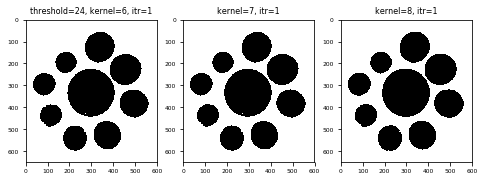

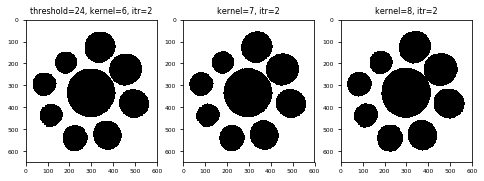

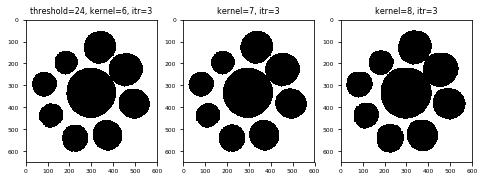

In [102]:
kdSize7 = (7,7)
kernel_d7 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kdSize7)
kdSize8 = (8,8)
kernel_d8 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kdSize8)

thresh=24
imrow=1
imcol=3

for itr in range(1,4,1):
    plt.figure(figsize=(8,100))
    e_k6Im = cv2.erode(FinaldilatedIm, kernel_d6, iterations=itr)
    plt.subplot(imrow, imcol, 1); plt.imshow(e_k6Im);
    plt.title("threshold={}, kernel={}, itr={}".format(thresh, kdSize6[0],itr), size=8)
    
    e_k7Im = cv2.erode(FinaldilatedIm, kernel_d7, iterations=itr)
    plt.subplot(imrow, imcol, 2); plt.imshow(e_k7Im);
    plt.title("kernel={}, itr={}".format(kdSize7[0],itr), size=8)

    e_k8Im = cv2.erode(FinaldilatedIm, kernel_d8, iterations=itr)
    plt.subplot(imrow, imcol, 3); plt.imshow(e_k8Im);
    plt.title("kernel={}, itr={}".format(kdSize8[0],itr), size=8)

## <font style = "color:rgb(50,255,50)">Conclusion for erosion kernel size and iteration </font>
The goal is to fill the white spot inside each coin without making the background cloudy again. It will be ideal to use kernel 6 with 2 iterations to fill back the area which the coins lost during dilation.

Kernels 7 and 8 do not help much but increasing the risk of connecting adjacent coins. 

Therefore, we will use kernel 6 with 2 iterations for the final erosion.

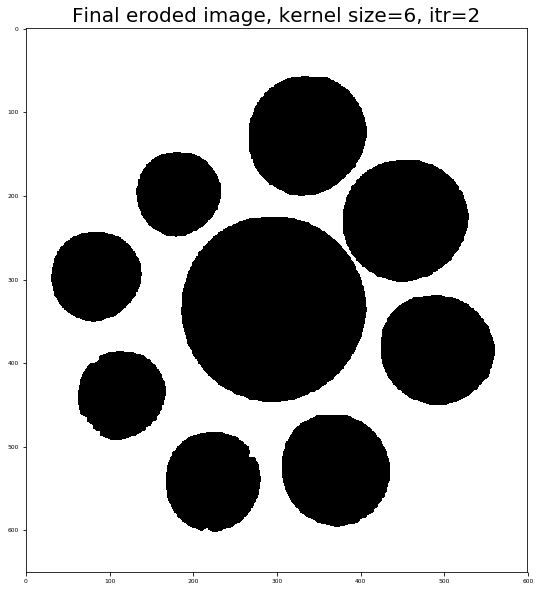

In [103]:
itr=2
FinalerodedIm=cv2.erode(FinaldilatedIm, kernel_d6, iterations=2)
plt.imshow(FinalerodedIm); plt.title("Final eroded image, kernel size={}, itr={}".format(kdSize6[0],itr),size=20); plt.show()


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [104]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [105]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [106]:
# Detect blobs
keypoints = detector.detect(FinalerodedIm)


## <font style = "color:rgb(50,255,50)">Use blob detection to count coins</font>
The number of coins is determined by the count of keypoints from the blob detection.

In [107]:
# Print number of coins detected

print("Number of contours found using blob detection= {}".format(len(keypoints)))


Number of contours found using blob detection= 9


**Note that we were able to detect all 9 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

## <font style = "color:rgb(50,255,50)">Use Blob Detection results to plot detected coins</font>

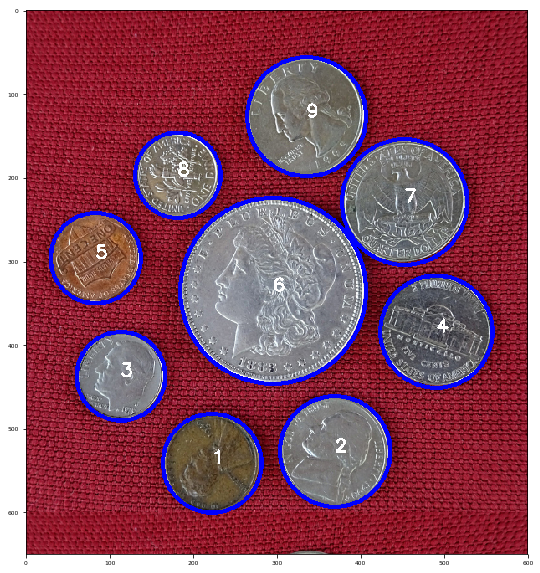

In [108]:
# Mark coins using image annotation concepts we have studied so far
blobIm=image.copy()
count=0
# Mark blobs using image annotation concepts we have studied so far
for k in keypoints:
    count+=1
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center using white font
    cv2.putText(blobIm,str(count),(x,y),cv2.FONT_HERSHEY_SIMPLEX, 0.7,(255,255,255),2)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in RED
    cv2.circle(blobIm,(x,y),radius,(255,0,0),3)
    
plt.imshow(blobIm[:,:,::-1])

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

## <font style = "color:rgb(50,255,50)">CCA on binary image</font>
If we directly apply the CCA on the binary image with light background, then the analysis output will not identify the coins but the background instead.

Therefore, we will need to invert the binary image to have dark background and bright coins first before applying the CCA.

In [109]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [110]:
#Invert the image to have dark background
thresh=128
maxValue=255

th2,Inv_FinalIm=cv2.threshold(FinalerodedIm, thresh, maxValue, cv2.THRESH_BINARY_INV )

# Find connected components
_, imLabels = cv2.connectedComponents(Inv_FinalIm)


In [111]:
# Print number of connected components detected
nComponents = imLabels.max()
print("Number of connected components detected = {}".format(nComponents))


Number of connected components detected = 9


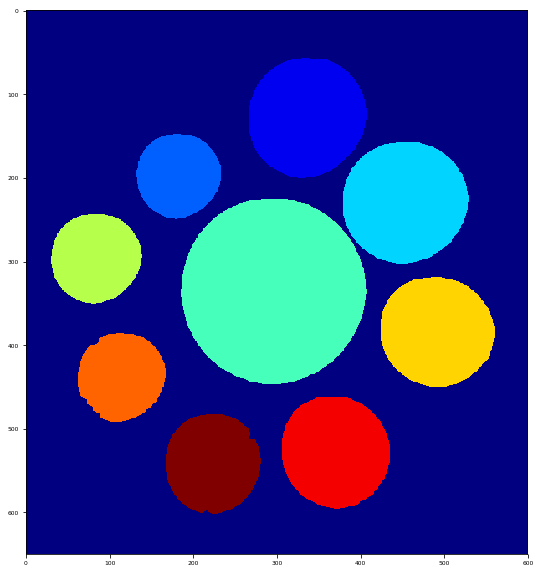

In [112]:
# Display connected components using displayConnectedComponents
# function

displayConnectedComponents(imLabels)

## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [113]:
# Find all contours in the image
#For contour analysis, first convert the image to have dark background before running contour analysis

contours, hierarchy = cv2.findContours(FinalerodedIm, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found using contour analysis= {}".format(len(contours)))


Number of contours found using contour analysis= 10


## <font style = "color:rgb(50,255,50)">Use Contour Analysis result to display the detected coins</font>

We obtained 10 contours instead of 9. Draw the contours to identify the contour locations.

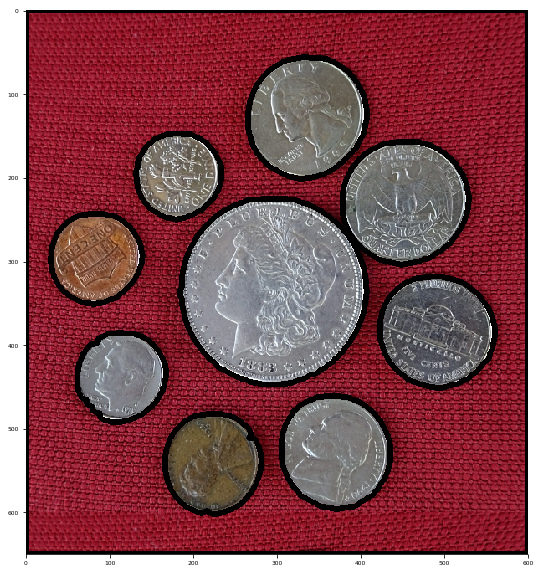

In [114]:
# Draw all contours
# Draw all the contours 
contourIm=image.copy()
# Draw all the contours #last element is line width
cv2.drawContours(contourIm, contours, -1, (0,0,0), 5);
plt.imshow(contourIm[:,:,::-1])


## <font style = "color:rgb(50,255,50)">Conclusion: The outmost perimeter is not a coin</font>

Use Contour Area value to identify the contour index. We would like remove this element from the contour list.

Number of contours found using contour analysis= 1


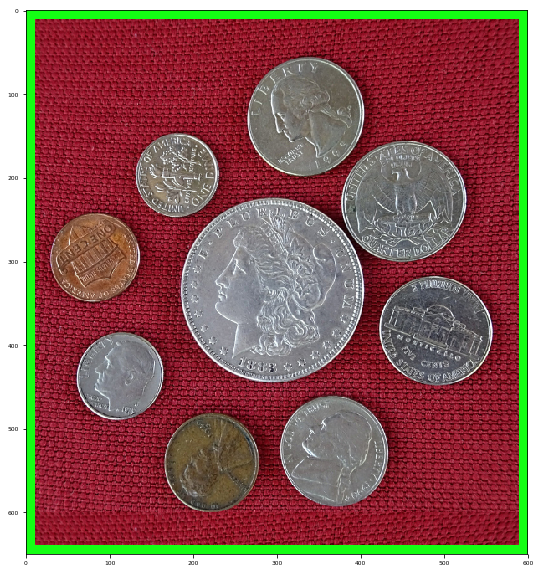

In [115]:
# Remove the inner contours
# Display the result

exctr, hierarchy = cv2.findContours(FinalerodedIm, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found using contour analysis= {}".format(len(exctr)))

exctrIm=image.copy()
# Draw all the contours #last element is line width
cv2.drawContours(exctrIm, exctr, -1, (20,255,20), 20);
plt.imshow(exctrIm[:,:,::-1])


Let's only consider the outer contours.

So, we only need the inner contours. The easiest way to do that will be to remove the outer contour using area.

In [116]:
# Print area and perimeter of all contours
area_array=[]
for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    area_array.append(area)
    perimeter = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area,perimeter))


Contour #1 has area = 10874.0 and perimeter = 400.33304035663605
Contour #2 has area = 13903.0 and perimeter = 444.4751765727997
Contour #3 has area = 8761.0 and perimeter = 361.5634891986847
Contour #4 has area = 14271.5 and perimeter = 448.0315240621567
Contour #5 has area = 9212.0 and perimeter = 359.8477612733841
Contour #6 has area = 38753.5 and perimeter = 739.4528782367706
Contour #7 has area = 17390.0 and perimeter = 495.24472749233246
Contour #8 has area = 8127.0 and perimeter = 338.5340507030487
Contour #9 has area = 16102.5 and perimeter = 476.1736603975296
Contour #10 has area = 388751.0 and perimeter = 2496.0


In [117]:
# Print maximum area of contour
# This will be the box that we want to remove
#Record the index of the maximum contour area
ctridx_max=np.argmax(np.array(area_array))
print("Maximum area of contour = {}".format(area_array[ctridx_max]))


Maximum area of contour = 388751.0


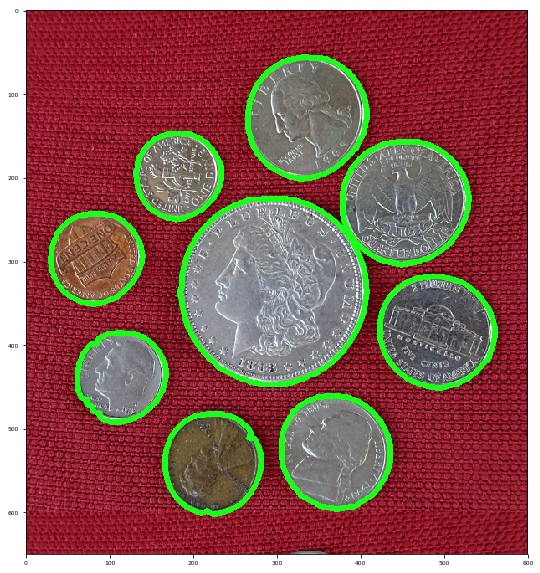

In [118]:
# Remove this contour and plot others
Innercontours=contours.copy()
Innercontours.pop(ctridx_max)
InnerCtrIm=image.copy()

cv2.drawContours(InnerCtrIm, Innercontours, -1, (25,255,25), 5);
plt.imshow(InnerCtrIm[:,:,::-1])

Number of coins detected = 9


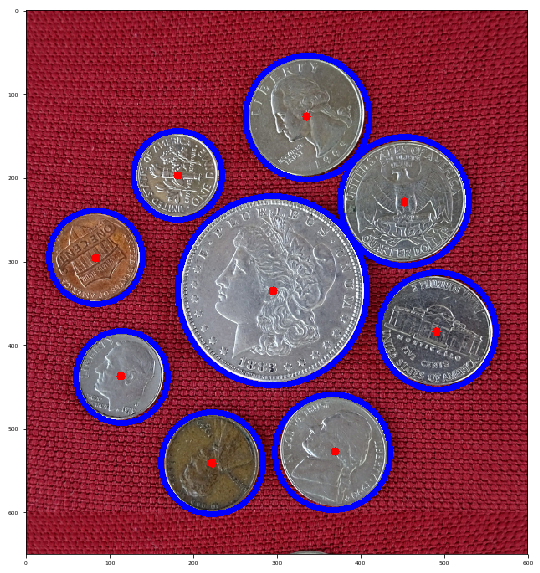

In [119]:
# Fit circles on coins
FinalIm=image.copy()
count=0
for cnt in Innercontours:
    
    # We will use the contour moments
    # to find the centroid
    M = cv2.moments(cnt)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    
    # Mark the center
    cv2.circle(FinalIm, (x,y), 5, (0,0,255), -1);

for cnt in Innercontours:
    # Fit a circle
    ((x,y),radius) = cv2.minEnclosingCircle(cnt)
    cv2.circle(FinalIm, (int(x),int(y)), int(round(radius)), (255,0,0), 5)
    
print("Number of coins detected = {}".format(len(Innercontours)))

plt.imshow(FinalIm[:,:,::-1])


# <font style = "color:rgb(50,120,229)">Assignment Part - B</font>

**Follow the same steps as provided in Assignment Part - A**

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

Text(0.5,1,'Original Image')

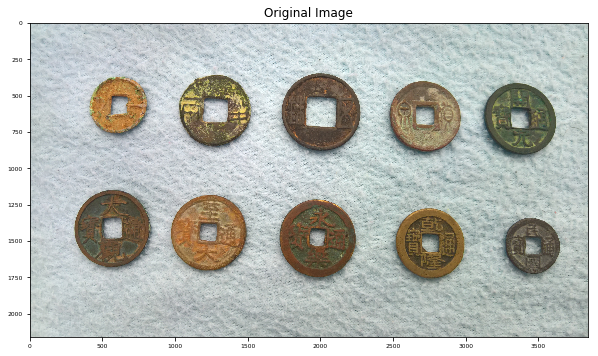

In [120]:
# Image path
imagePath = DATA_PATH + "images/CoinsB.png"
# Read image
# Store it in variable image
image= cv2.imread(imagePath,cv2.IMREAD_COLOR)

plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [121]:
# Convert to grayscale
# Store in variable imageGray
imageGray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)


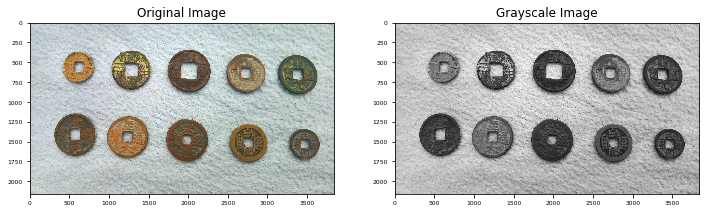

In [122]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [123]:
# Split cell into channels
# Variables are: imageB, imageG, imageR
imageB,imageG,imageR = cv2.split(image)


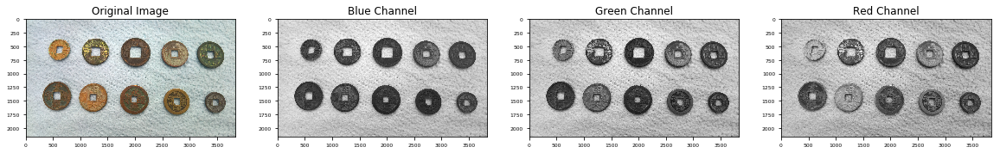

In [124]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

## <font style = "color:rgb(25,255,25)">Experiment: Perform thresholding at different channels </font>
Find out the image with best contrast.

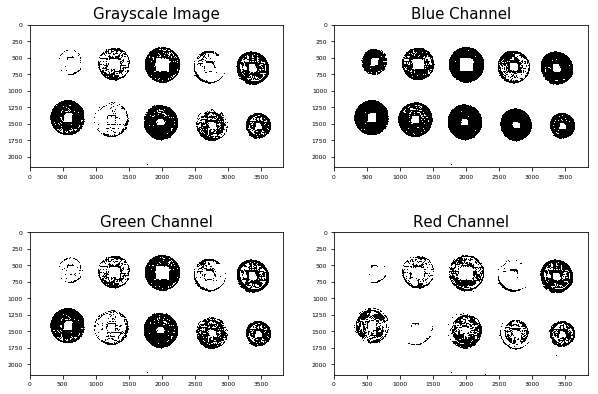

In [125]:
#Double check the images from different channel
thresh=100
maxValue=255
th, threshedImGr = cv2.threshold(imageGray, thresh, maxValue, cv2.THRESH_BINARY)
th, threshedImB=cv2.threshold(imageB, thresh, maxValue, cv2.THRESH_BINARY)
th, threshedImG=cv2.threshold(imageG, thresh, maxValue, cv2.THRESH_BINARY)
th, threshedImR=cv2.threshold(imageR, thresh, maxValue, cv2.THRESH_BINARY)
plt.figure(figsize=(10,7))
plt.subplot(221)
plt.imshow(threshedImGr);
plt.title("Grayscale Image",size=15)
plt.subplot(222)
plt.imshow(threshedImB);
plt.title("Blue Channel",size=15)
plt.subplot(223)
plt.imshow(threshedImG);
plt.title("Green Channel",size=15)
plt.subplot(224)
plt.imshow(threshedImR);
plt.title("Red Channel",size=15);

## <font style = "color:rgb(25,255,25)">Conclusion: Blue-channel image has the best contrast</font>
Perform thresholding on the blue-channel image because the good contrast can help efficiently perform the closing operation to remove dark spots at the bright background and the opening operation to remove the white spots on the dark coins. 

## <font style = "color:rgb(25,255,25)">Experiment: Step through multiple threshold values </font>
Run through a rough list of threshhold values and identify the range to review threshold values in details in the next step
Use THRESH_BINARY to find the darkest coins first. It is easier to view the white spots on the dark coins. Choose the threshold values that produce the darkest coins.


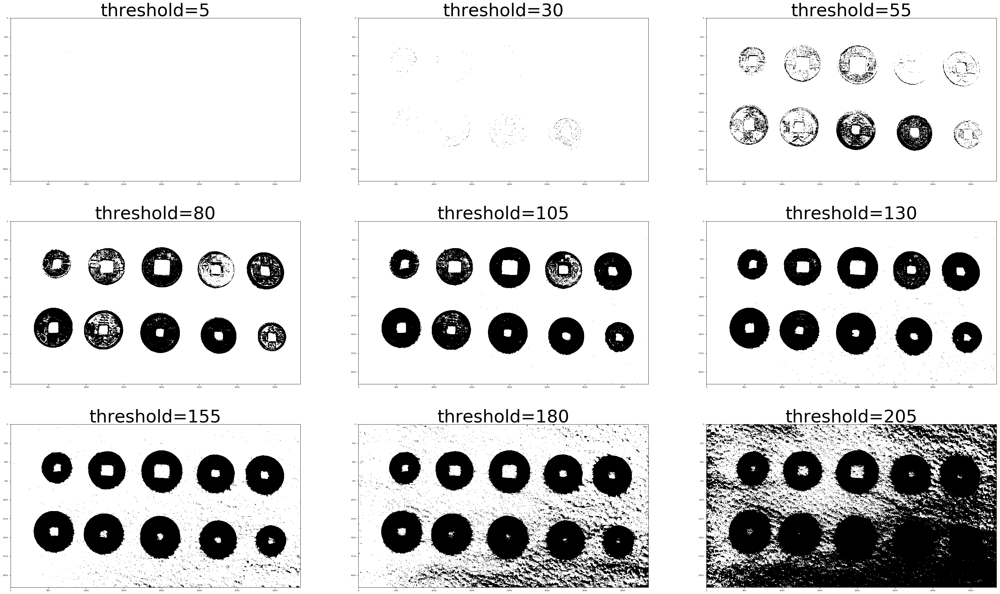

In [126]:
maxValue=255
image_array=[]
qty=9
step=25
start=5
end=start+step*qty+1

for thresh in range(5,end,25):
    th, dst = cv2.threshold(imageB, thresh, maxValue, cv2.THRESH_BINARY)
    image_array.append(dst)

plt.figure(figsize=(50,30))

imrow=3
imcol=3
for i in range(qty):
    plt.subplot(imrow, imcol, i + 1)
    plt.imshow(image_array[i])
    plt.title("threshold={}".format(start+i*step), size=50)
plt.show()
    


## <font style = "color:rgb(25,255,25)">Experiment: Detail threshold steps at the range from 120 to 160</font>
The thresholds ranging from 120 to 160 may work. Lower the threshold step to 3.


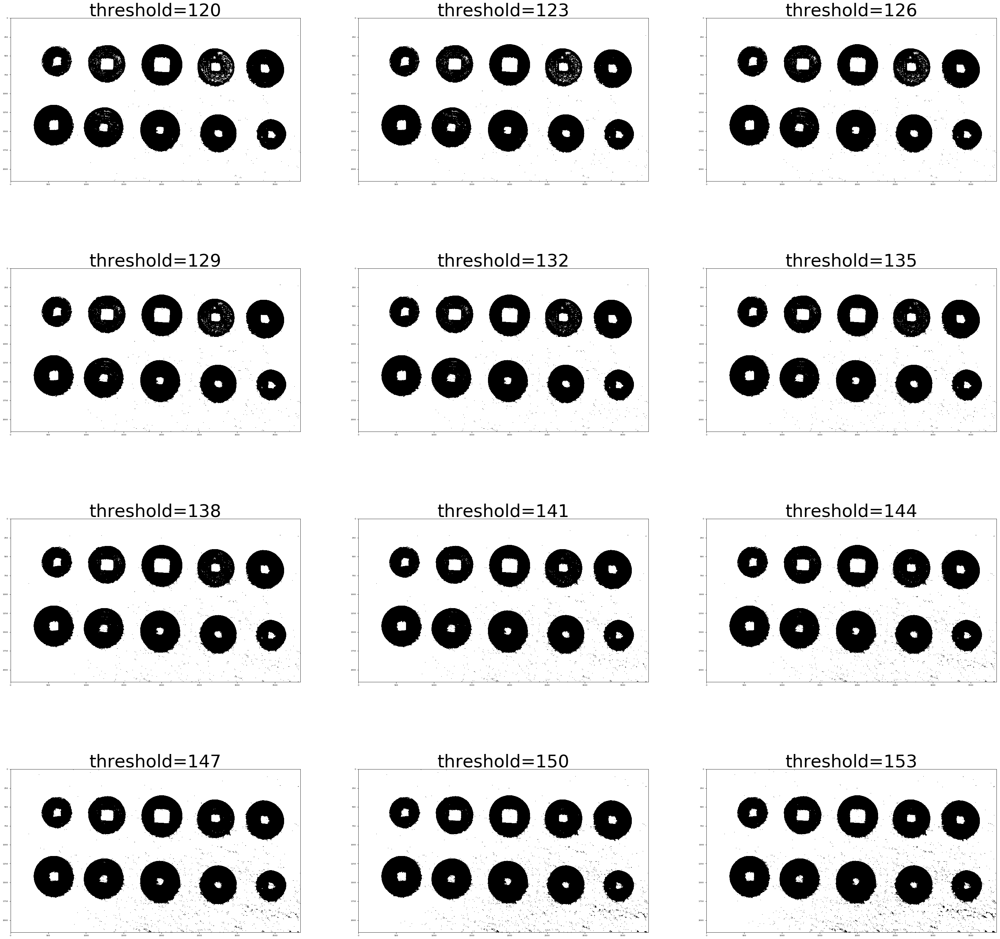

In [127]:
maxValue=255
image_array=[]
plt.figure(figsize=(50,50))

imrow=4
imcol=3
qty=12
step=3
start=120
end=start+qty*step+1

for thresh in range(start,end,step):
    th, dst = cv2.threshold(imageB, thresh, maxValue, cv2.THRESH_BINARY)
    image_array.append(dst)
    
for i in range(qty):
    plt.subplot(imrow, imcol, i + 1)
    plt.imshow(image_array[i])
    plt.title("threshold={}".format(start+i*step), size=50)
    
plt.show()

## <font style="color:rgb(25,255,25)" >Experiment: Narrow to the threshold range 130~140</font>
For threshold around 130 to 140, they all seem to meet the criteria of having completely dark coins and bright background with minor blurry spots

Use post-opening Image for comparison. Include two kernel sizes. Step through the threshold in this set and use post-opening image quality to select the final threshold value.

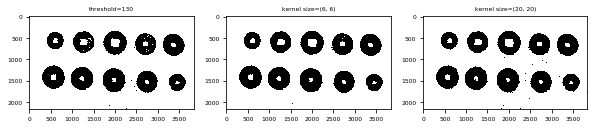

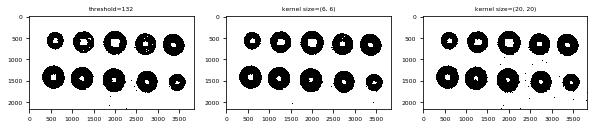

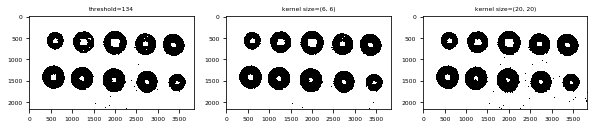

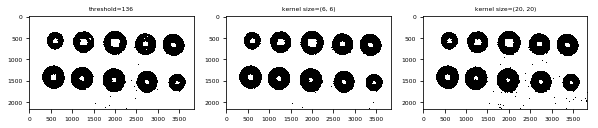

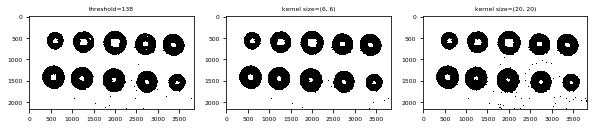

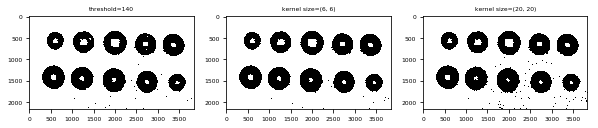

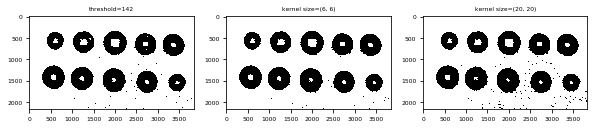

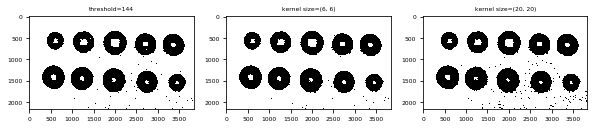

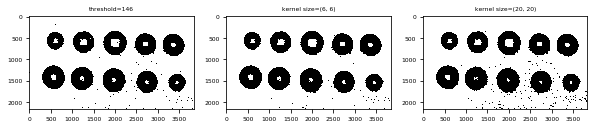

In [128]:
matplotlib.rcParams['xtick.labelsize']=6
matplotlib.rcParams['ytick.labelsize']=6

#Apply "opening" on thresholded image (Kernel size 1)
kdSize6 = (6,6)
kernel_d6 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kdSize6)

#Apply "opening" on thresholded image (Kernel size 2)
kdSize20 = (20,20)
kernel_d20 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kdSize20)

imrow=1
imcol=3
qty=9
step=2
start=130
end=start+qty*step

itr=1

for thresh in range(start,end,step):
    th, dst = cv2.threshold(imageB, thresh, maxValue, cv2.THRESH_BINARY)
    plt.figure(figsize=(10,50))
    plt.subplot(imrow, imcol, 1); plt.imshow(dst);
    plt.title("threshold={}".format(thresh), size=6)
    
    openedIm6 = cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel_d6, iterations=itr)
    plt.subplot(imrow, imcol, 2); plt.imshow(openedIm6);
    plt.title("kernel size={}".format(kdSize6), size=6)
    
    openedIm20 = cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel_d20, iterations=itr)
    plt.subplot(imrow, imcol, 3); plt.imshow(openedIm20);
    plt.title("kernel size={}".format(kdSize20), size=6)


## <font style="color:rgb(25,255,25)">Conclusion: Threshold value=136 on Blue-channel image</font>
(1) Background clean up- Large kernel leaves more dark spots in the background
    However, the goal of opening is to remove center holes on the coins.
    Large kernel size does a better job on that.
    
(2) If we use smaller kernel, the number of white spots on the coins starts decreasing at threshold 134

(3) Number of dark spots on the background increases starting at threshold 138. In general, the large kernel makes lots of dark spots at the background. However, it is still tolerable at threshold 134~136. 

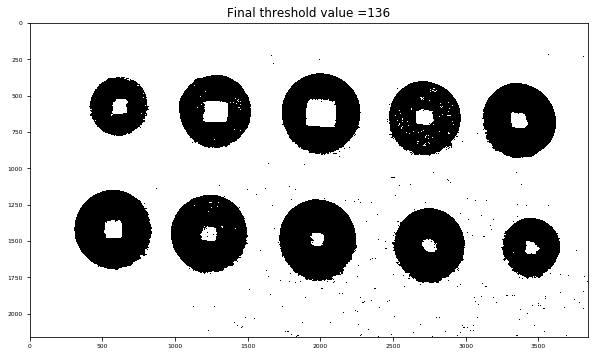

In [129]:
thresh=136
th, threshedIm = cv2.threshold(imageB, thresh, maxValue, cv2.THRESH_BINARY)
plt.imshow(threshedIm); plt.title("Final threshold value ={}".format(thresh),size=12); plt.show()

## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

## <font style="color:rgb(0,0,0)"> Compare "Open-then-close" and "Close-then-open"</font>
There will be two sections of morphological operations. In the first section, we will experiment the optimized opening operation and then apply the closing operation on top of the "opened" image. In the next section, we will apply the optimized closing operation first and then apply the opening operation on top of the "closed" image. We will then compare the results in two sections.

## <font style="color:rgb(255,25,25)"> Section 1: Trial for "Open then Close" Iterations</font>

## <font style="color:rgb(25,255,25)"> Experiment for Initial Opening </font>
We will use large kernel to remove center holes at the coins as much as possible without significantly adding dark spots at the background.
Compare the opening iteration to determine final decision


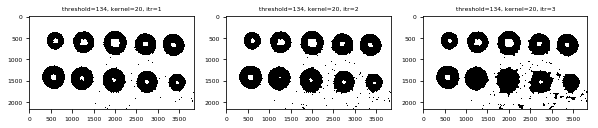

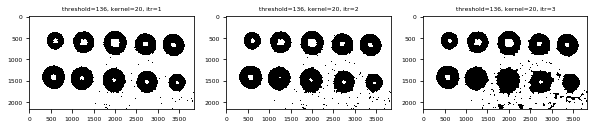

In [130]:
imrow=1
imcol=3
qty=2
step=2
start=134
end=start+qty*step

for thresh in range(start,end,step):
    th, dst = cv2.threshold(imageB, thresh, maxValue, cv2.THRESH_BINARY)
    plt.figure(figsize=(10,50))
    op_itrIm1 = cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel_d20, iterations=1)
    plt.subplot(imrow, imcol, 1); plt.imshow(op_itrIm1);
    plt.title("threshold={}, kernel={}, itr={}".format(thresh, kdSize20[0],1), size=6)
    
    op_itrIm2 = cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel_d20, iterations=2)
    plt.subplot(imrow, imcol, 2); plt.imshow(op_itrIm2);
    plt.title("threshold={}, kernel={}, itr={}".format(thresh, kdSize20[0],2), size=6)
    
    
    op_itrIm3 = cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel_d20, iterations=3)
    plt.subplot(imrow, imcol, 3); plt.imshow(op_itrIm3);
    plt.title("threshold={}, kernel={}, itr={}".format(thresh, kdSize20[0],3), size=6)
    


## <font style="color:rgb(25,255,25)"> Conclusion for Initial opening </font>
(1) Use kernel size 20 and many iterations to minimize center holes on coins

(2) However, we realized by the time the center holes are removed, the background has become very messy. We will not be able to efficiently use the closing operation to clean up the background. 

(3) Therefore, it is more efficient to use the closing operation first to remove all dark spots at the background and then use the opening operation to close the center holes at the coins. 

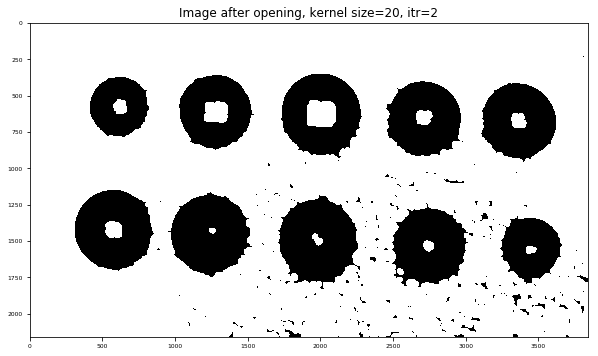

In [131]:
itr=2
# Apply opening function on the blue-channel image
# With two iterations of opening, the background is already messy. Therefore, we cannot use the opening operation first on the initial image.

IntopenedIm = cv2.morphologyEx(threshedIm, cv2.MORPH_OPEN, kernel_d20, iterations=itr)
plt.imshow(IntopenedIm); plt.title("Image after opening, kernel size={}, itr={}".format(kdSize20[0],itr),size=12);



## <font style="color:rgb(25,255,25)">Conclusion: Remove the dark spot at the background first before filling the center holes of the coins</font>  

There is no need to pursue the "open-then-close" operation.


## <font style="color:rgb(255,25,25)"> Section 2: Trial for "Close then Open" Iterations</font>

## <font style="color:rgb(25,255,25)"> Experiment for Initial Closing </font>
We will use larger kernel to first remove dark spots on the background without significantly adding white spots at the coins. Compare the closing iteration to determine final decision



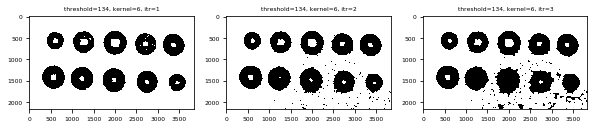

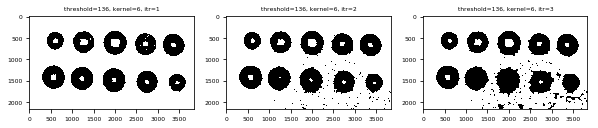

In [132]:

imrow=1
imcol=3
qty=2
step=2
start=134
end=start+qty*step

for thresh in range(start,end,step):
    th, dst = cv2.threshold(imageB, thresh, maxValue, cv2.THRESH_BINARY)
    plt.figure(figsize=(10,50))
    cl_itrIm1 = cv2.morphologyEx(dst, cv2.MORPH_CLOSE, kernel_d6, iterations=1)
    plt.subplot(imrow, imcol, 1); plt.imshow(cl_itrIm1);
    plt.title("threshold={}, kernel={}, itr={}".format(thresh, kdSize6[0],1), size=6)
    
    cl_itrIm2 = cv2.morphologyEx(dst, cv2.MORPH_CLOSE, kernel_d6, iterations=2)
    plt.subplot(imrow, imcol, 2); plt.imshow(op_itrIm2);
    plt.title("threshold={}, kernel={}, itr={}".format(thresh, kdSize6[0],2), size=6)
    
    
    cl_itrIm3 = cv2.morphologyEx(dst, cv2.MORPH_CLOSE, kernel_d6, iterations=3)
    plt.subplot(imrow, imcol, 3); plt.imshow(op_itrIm3);
    plt.title("threshold={}, kernel={}, itr={}".format(thresh, kdSize6[0],3), size=6)
    

## <font style="color:rgb(25,255,25)"> Conclusion for Initial closing </font>
(1) Use kernel size 6 and iteration=2 to remove the dark spots on the background. 

(2) Keep the threshold to be 136

(3) More iterations make the background more cloudy


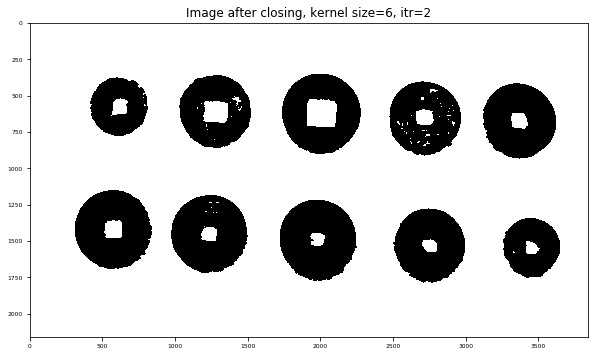

In [133]:
itr=2
# Apply dilate function on the input image

FinalclosedIm = cv2.morphologyEx(threshedIm, cv2.MORPH_CLOSE, kernel_d6, iterations=itr)
plt.imshow(FinalclosedIm); plt.title("Image after closing, kernel size={}, itr={}".format(kdSize6[0],itr),size=12); plt.show()



## <font style="color:rgb(25,255,25)"> Experiment: Kernel Size and iterations for the "close then open" operation</font>
The goal is to remove the center holes at the coins without making the background cloudy again.

It is important to make sure the closing operation had removed nearly all dark spots in the background
We will try different kernel sizes (6,12,20) and iterations (1 ~8) to determine the final selection for the open operation.

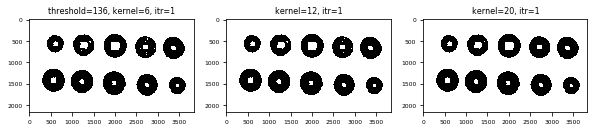

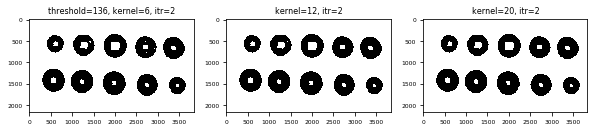

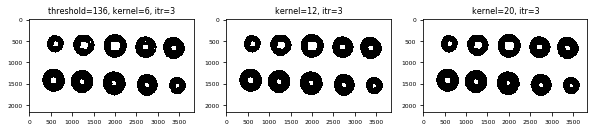

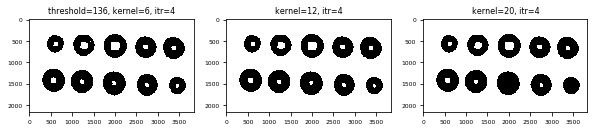

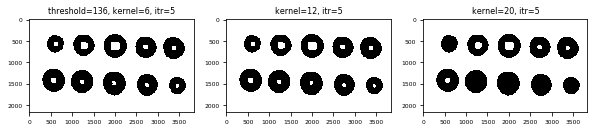

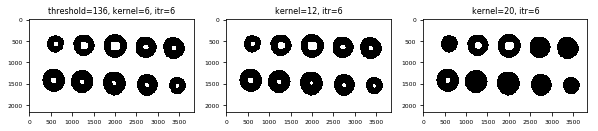

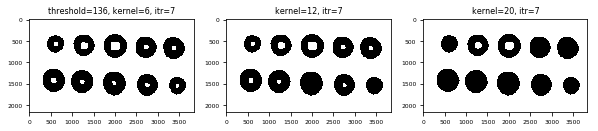

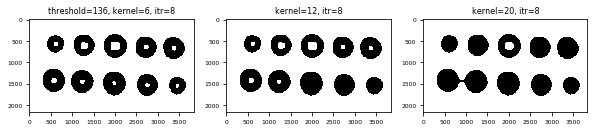

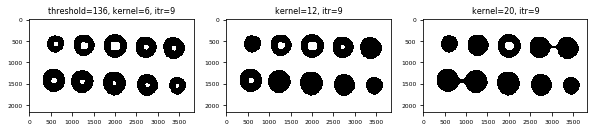

In [134]:
kdSize12 = (12,12)
kernel_d12 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kdSize12)

kdSize20 = (20,20)
kernel_d20 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kdSize20)

imrow=1
imcol=3
thresh=136

for itr in range(1,10,1):
    plt.figure(figsize=(10,50))
    
    op_k6Im = cv2.morphologyEx(FinalclosedIm, cv2.MORPH_OPEN, kernel_d6, iterations=itr)
    plt.subplot(imrow, imcol, 1); plt.imshow(op_k6Im);
    plt.title("threshold={}, kernel={}, itr={}".format(thresh, kdSize6[0],itr), size=8)  

    op_k12Im = cv2.morphologyEx(FinalclosedIm, cv2.MORPH_OPEN, kernel_d12, iterations=itr)
    plt.subplot(imrow, imcol, 2); plt.imshow(op_k12Im);
    plt.title("kernel={}, itr={}".format(kdSize12[0],itr), size=8)
    
    op_k20Im = cv2.morphologyEx(FinalclosedIm, cv2.MORPH_OPEN, kernel_d20, iterations=itr)
    plt.subplot(imrow, imcol, 3); plt.imshow(op_k20Im);
    plt.title("kernel={}, itr={}".format(kdSize20[0],itr), size=8)


## <font style="color:rgb(25,255,25)"> Conclusion for opening: kernel size 20 and 7 iterations </font>
The goal is to remove white center at each coin without making the background cloudy again. Kernel 20 with 7 iterations works well without connecting adjacent coins. An additional iteration afterward does not help but reducing the spacing between coins. Therefore, use kernel 20 and 7 iterations 

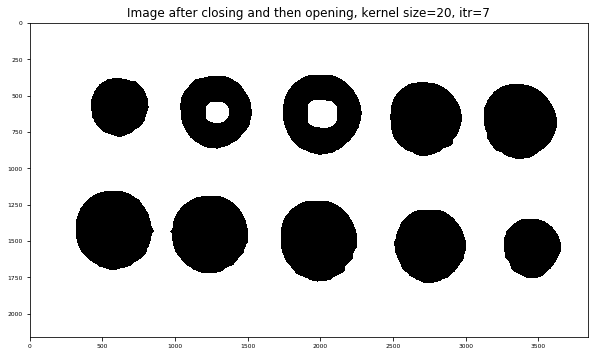

In [135]:
itr=7
Itrcl2opIm=cv2.morphologyEx(FinalclosedIm, cv2.MORPH_OPEN, kernel_d20, iterations=itr)
plt.imshow(Itrcl2opIm); plt.title("Image after closing and then opening, kernel size={}, itr={}".format(kdSize20[0],itr),size=12); plt.show()



## <font style="color:rgb(25,255,25)"> Experiment: Multiple "Close then Open" opersions </font> 
We would like to observe the image quality after multiple "Close then Open" operations.


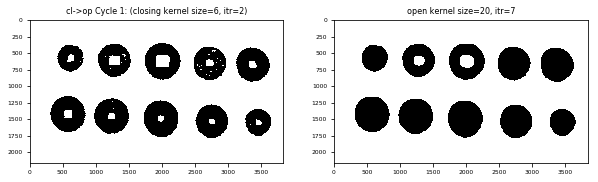

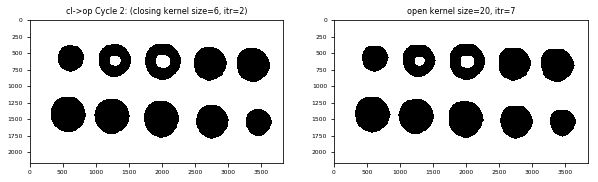

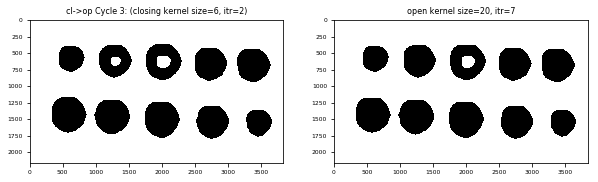

In [136]:
InitialIm=threshedIm.copy()
closingItr=2
openingItr=7
imrow=1
imcol=2
itr=3
for i in range(itr):
    
    plt.figure(figsize=(10,15))
    NowclosedIm = cv2.morphologyEx(InitialIm, cv2.MORPH_CLOSE, kernel_d6, iterations=closingItr)
    plt.subplot(imrow, imcol, 1);
    plt.imshow(NowclosedIm); plt.title("cl->op Cycle {}: (closing kernel size={}, itr={})".format(str(i+1),kdSize6[0],closingItr),size=8); 
    
    Nowcl2opIm=cv2.morphologyEx(NowclosedIm, cv2.MORPH_OPEN, kernel_d20, iterations=openingItr)
    plt.subplot(imrow, imcol, 2);
    plt.imshow(Nowcl2opIm); plt.title("open kernel size={}, itr={}".format(kdSize20[0],openingItr),size=8); 
    InitialIm=Nowcl2opIm.copy()


## <font style="color:rgb(25,255,25)"> Conclusion: One "Close then Open" operation serves the purpose. </font>
More iterations deform the contour of the coins.

## <font style="color:rgb(25,255,25)"> Final Image after the morphological operation set</font>
(1) Take the Blue-channel image and perform thresholding at 136

(2) Set the closing operation to have kernel size (6,6) and run two iterations to remove nearly all dark spots at the background

(3) Set the opening operation to have kernel size (20,20) and run 7 iterations to close the white holes at the coins

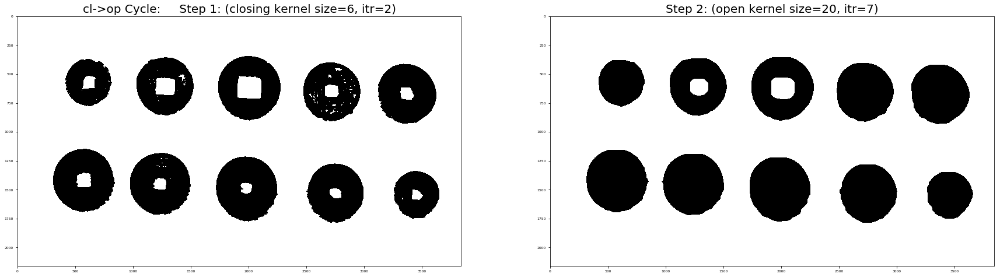

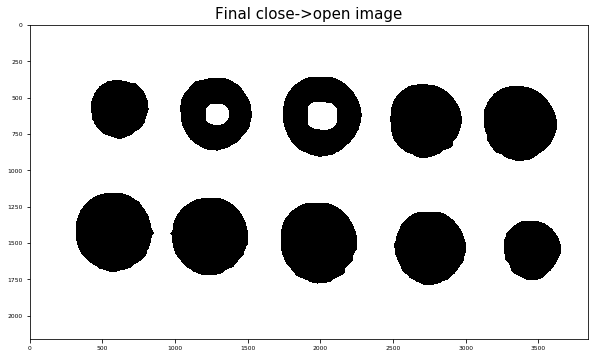

In [137]:
#Final close to open image. Start from the image after thresholding

InitialIm=threshedIm.copy()
closingItr=2
openingItr=7
imrow=1
imcol=2
itr=1
    
plt.figure(figsize=(30,10))
NowclosedIm = cv2.morphologyEx(InitialIm, cv2.MORPH_CLOSE, kernel_d6, iterations=closingItr)
plt.subplot(imrow, imcol, 1);
plt.imshow(NowclosedIm); plt.title("cl->op Cycle:     Step 1: (closing kernel size={}, itr={})".format(kdSize6[0],closingItr),size=20); 
    
Nowcl2opIm=cv2.morphologyEx(NowclosedIm, cv2.MORPH_OPEN, kernel_d20, iterations=openingItr)
plt.subplot(imrow, imcol, 2);
plt.imshow(Nowcl2opIm); plt.title("Step 2: (open kernel size={}, itr={})".format(kdSize20[0],openingItr),size=20); 

Finalcl2opIm=Nowcl2opIm.copy()
plt.figure(figsize=(10,15))
plt.imshow(Finalcl2opIm);
plt.title("Final close->open image",size=15);
plt.show()


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [138]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [139]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)


## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [140]:
# Detect blobs
keypoints = detector.detect(Finalcl2opIm)
print("Number of coins detected = {}".format(len(keypoints)))


Number of coins detected = 8


## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

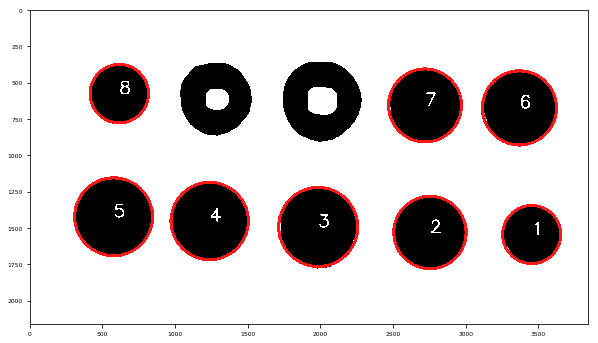

In [141]:
blobIm = cv2.cvtColor(Finalcl2opIm, cv2.COLOR_GRAY2BGR)
 
# Mark blobs using image annotation concepts we have studied so far
count=0
for k in keypoints:
    count+=1
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in BLACK
    cv2.putText(blobIm,str(count),(x,y),cv2.FONT_HERSHEY_SIMPLEX, 4,(255,255,255),10)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in RED
    cv2.circle(blobIm,(x,y),radius,(25,25,255),20)
    
plt.imshow(blobIm[:,:,::-1])

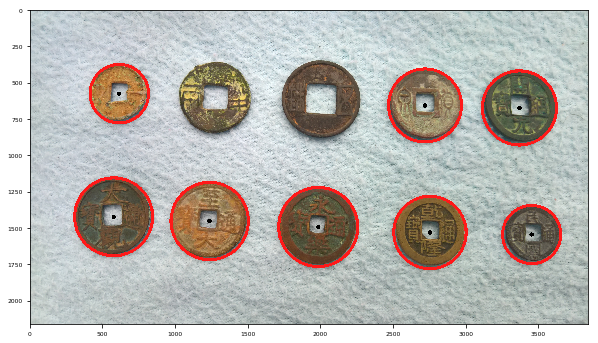

In [142]:
#Show detection on the original image
blobOriginal=image.copy()
# Mark blobs using image annotation concepts we have studied so far
count=0
for k in keypoints:
    count+=1
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in BLACK
    cv2.circle(blobOriginal,(x,y),5,(0,0,0),20)
    #cv2.putText(blobIm,str(count),(x,y),cv2.FONT_HERSHEY_SIMPLEX, 4,(255,255,255),10)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in RED
    cv2.circle(blobOriginal,(x,y),radius,(25,25,255),20)
    
plt.imshow(blobOriginal[:,:,::-1])


**Note that we were able to detect 8 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

Now, let's perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

## <font style="color:rgb(25,255,25)">CCA requires target objects to have bright colors and dark background</font>
We will invert the final "Close then Open" image before CCA.


(2160, 3840)


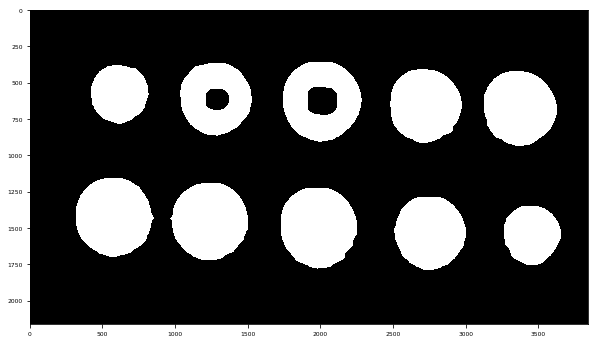

In [143]:
thresh=128
maxValue=255

th2,Inv_FinalIm=cv2.threshold(Finalcl2opIm, thresh, maxValue, cv2.THRESH_BINARY_INV )
print(Inv_FinalIm.shape)
plt.imshow(Inv_FinalIm)

In [144]:
# Find connected components
_, imLabels = cv2.connectedComponents(Inv_FinalIm)
nComponents = imLabels.max()
print("Number of connected components detected = {}".format(nComponents))


Number of connected components detected = 10


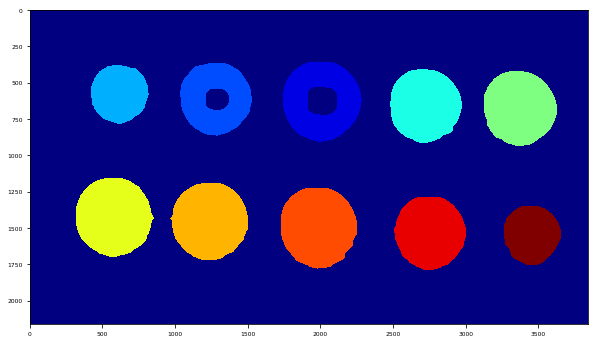

In [145]:
displayConnectedComponents(imLabels)


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [146]:
# Find all contours in the image

contours, hierarchy = cv2.findContours(Finalcl2opIm, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)




In [147]:
# Print the number of contours found

print("Number of contours found = {}".format(len(contours)))

Number of contours found = 13


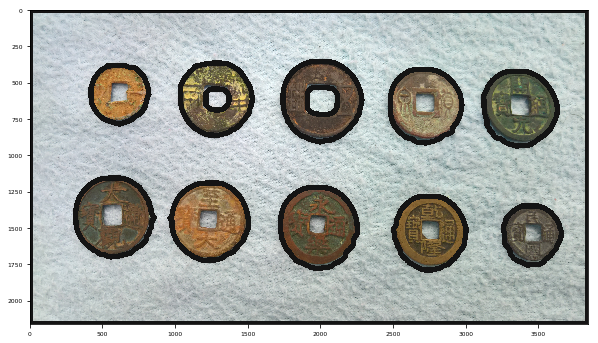

In [148]:
# Draw all contours
contourIm=image.copy()
# Draw all the contours #last element is line width
cv2.drawContours(contourIm, contours, -1, (20,20,20), 35);

plt.imshow(contourIm[:,:,::-1])


Number of contours found = 1


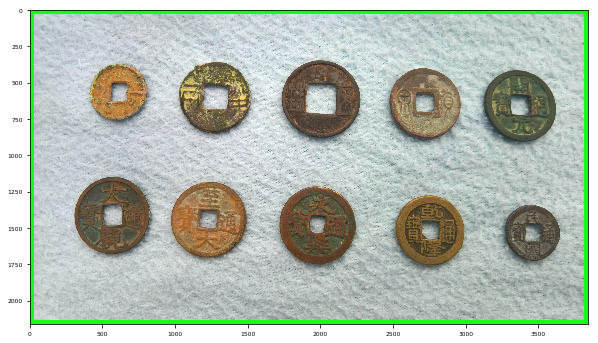

In [149]:
# Remove the inner contours
# Display the result
Excontours, hierarchy = cv2.findContours(Finalcl2opIm, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

print("Number of contours found = {}".format(len(Excontours)))

ExcontourIm=image.copy()
# Draw all the contours #last element is line width
cv2.drawContours(ExcontourIm, Excontours, -1, (20,255,20), 50);
plt.imshow(ExcontourIm[:,:,::-1])

What do you think went wrong? As we can see, the outer box was detected as a contour and with respect to it, all other contours are internal and that's why they were not detected. How do we remove that? Let's see if we can use area of contours here.

In [150]:
# Print area and perimeter of all contours
area_array=[]
for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    area_array.append(area)
    perimeter = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area,perimeter))



Contour #1 has area = 125464.5 and perimeter = 1334.4377264976501
Contour #2 has area = 194654.0 and perimeter = 1662.3859864473343
Contour #3 has area = 231932.0 and perimeter = 1811.1555432081223
Contour #4 has area = 221948.0 and perimeter = 1773.4398132562637
Contour #5 has area = 226439.0 and perimeter = 1796.611384510994
Contour #6 has area = 19678.5 and perimeter = 521.060963511467
Contour #7 has area = 34190.0 and perimeter = 691.4457395076752
Contour #8 has area = 204439.0 and perimeter = 1699.557563662529
Contour #9 has area = 198015.0 and perimeter = 1677.47430062294
Contour #10 has area = 125872.0 and perimeter = 1336.5382319688797
Contour #11 has area = 194789.0 and perimeter = 1656.9301456212997
Contour #12 has area = 235173.0 and perimeter = 1818.6113895177841
Contour #13 has area = 8288401.0 and perimeter = 11996.0


In [151]:
# Print maximum area of contour
# This will be the box that we want to remove
ctridx_max=np.argmax(np.array(area_array))
print("Maximum area of contour = {}".format(area_array[ctridx_max]))


Maximum area of contour = 8288401.0


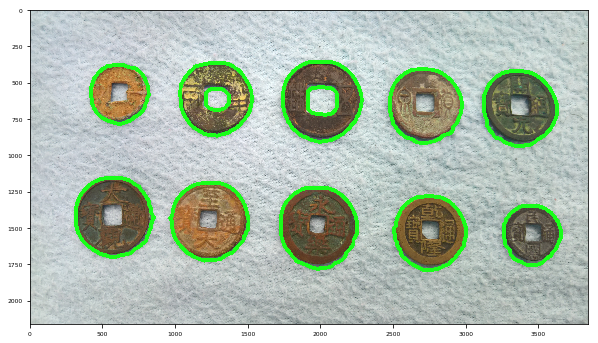

In [152]:
# Remove this contour and plot others
Innercontours=contours.copy()
Innerarray=area_array.copy()

Innercontours.pop(ctridx_max)
Innerarray.pop(ctridx_max)

InnerctrIm=image.copy()
# Draw all the contours #last element is line width
cv2.drawContours(InnerctrIm, Innercontours, -1, (25,255,25), 25);

plt.imshow(InnerctrIm[:,:,::-1])


Now, we have to remove the internal contours. Again here we can use area or perimeter.

In [153]:
# Print sorted area of contours
sorted_area=np.sort(area_array)
for i in range(len(area_array)):
    print(sorted_area[i])


19678.5
34190.0
125464.5
125872.0
194654.0
194789.0
198015.0
204439.0
221948.0
226439.0
231932.0
235173.0
8288401.0


We can clearly see the jump from 2nd area to 3rd. These are the 2 inner contours.

Number of contours = 10


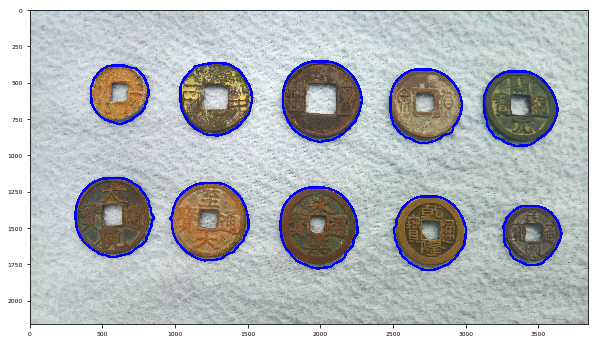

In [154]:
# Remove the 2 inner contours
# Plot the rest of them

ctridx_min1=np.argmin(np.array(Innerarray))
Innercontours.pop(ctridx_min1)
Innerarray.pop(ctridx_min1)

ctridx_min2=np.argmin(np.array(Innerarray))
Innercontours.pop(ctridx_min2)

print("Number of contours = {}".format(len(Innercontours)))

OnlyCoinIm=image.copy()
# Draw only the contours of coins
cv2.drawContours(OnlyCoinIm, Innercontours, -1, (255,0,0), 15);

plt.imshow(OnlyCoinIm[:,:,::-1])

Number of coins detected = 10


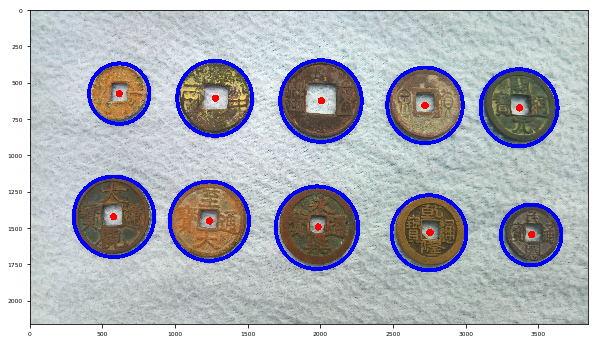

In [155]:
# Fit circles on coins
FinalIm=image.copy()
count=0
for cnt in Innercontours:
    
    # We will use the contour moments
    # to find the centroid
    M = cv2.moments(cnt)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    
    # Mark the center
    cv2.circle(FinalIm, (x,y), 25, (0,0,255), -1);

for cnt in Innercontours:
    # Fit a circle
    ((x,y),radius) = cv2.minEnclosingCircle(cnt)
    cv2.circle(FinalIm, (int(x),int(y)), int(round(radius)), (255,0,0), 25)
    
print("Number of coins detected = {}".format(len(Innercontours)))

plt.imshow(FinalIm[:,:,::-1])


## <font style="Color: rgb(25,255,25)">End of File